In [1]:
import ee
import geemap
import folium
import numpy as np

In [2]:
ee.Authenticate()
ee.Initialize(project='shrubland-coverage') # Replace with your project's name

In [3]:
threedep_10m = ee.ImageCollection('USGS/3DEP/10m_collection')
threedep_10m

In [4]:
print("Total images in collection:", threedep_10m.size().getInfo())
first_img = threedep_10m.first()
print("\nFirst image info (short):")
print(first_img.getInfo()['properties'].keys())

Total images in collection: 1447

First image info (short):
dict_keys(['system:time_start', 'system:footprint', 'system:time_end', 'system:asset_size', 'system:index'])


In [5]:
band_names = first_img.bandNames().getInfo()
print("Band names:", band_names)

Band names: ['elevation']


In [6]:
elevation = threedep_10m.select('elevation')

In [7]:
pt = ee.Geometry.Point([-122.57, 39.18])
# Get ONE image (tile) that intersects the point
elev_img = elevation.filterBounds(pt).first()
elev_img

In [8]:
print(elev_img.select('elevation').getInfo()['bands'][0])

{'id': 'elevation', 'data_type': {'type': 'PixelType', 'precision': 'float'}, 'dimensions': [10812, 10812], 'crs': 'EPSG:4269', 'crs_transform': [9.259259269220167e-05, 0, -123.00055555579371, 0, -9.259259269220167e-05, 40.000555556394715]}


In [9]:
print("scale (m):", elev_img.projection().nominalScale().getInfo())
print("projection:", elev_img.projection().getInfo())

scale (m): 10.307360269724873
projection: {'type': 'Projection', 'crs': 'EPSG:4269', 'transform': [9.259259269220167e-05, 0, -123.00055555579371, 0, -9.259259269220167e-05, 40.000555556394715]}


In [10]:
# Derive slope + aspect (degrees) 
slope_img = ee.Terrain.slope(elev_img).rename("slope")
aspect_img = ee.Terrain.aspect(elev_img).rename("aspect")

In [11]:

print(slope_img.select('slope').getInfo()['bands'][0])
print(aspect_img.select('aspect').getInfo()['bands'][0])

{'id': 'slope', 'data_type': {'type': 'PixelType', 'precision': 'float', 'min': 0, 'max': 90}, 'crs': 'EPSG:4269', 'crs_transform': [9.259259269220167e-05, 0, -123.00055555579371, 0, -9.259259269220167e-05, 40.000555556394715]}
{'id': 'aspect', 'data_type': {'type': 'PixelType', 'precision': 'float', 'min': 0, 'max': 360}, 'crs': 'EPSG:4269', 'crs_transform': [9.259259269220167e-05, 0, -123.00055555579371, 0, -9.259259269220167e-05, 40.000555556394715]}


In [12]:

roi = pt.buffer(20_000).bounds()   # ~20 km radius box
elev_img = elev_img.clip(roi)
slope_img  = slope_img.clip(roi)
aspect_img = aspect_img.clip(roi)

# Visualization params
elev_vis = {
    "min": 0,
    "max": 3000, # Estimated max value of about 3km above sea level
    "palette": ["0000ff", "00ffff", "00ff00", "ffff00", "ff0000", "ffffff"]
}

slope_vis = {
    "min": 0,
    "max": 90,  # degrees
    "palette": ["ffffff", "fff7bc", "fec44f", "fe9929", "ec7014", "cc4c02", "8c2d04"]
}

aspect_vis = {
    "min": 0,
    "max": 360,  # degrees
    "palette": ["ff0000", "ffff00", "00ff00", "00ffff", "0000ff", "ff00ff", "ff0000"]
}

# Helper Function: add an EE image as a Folium tile layer
def add_ee_layer(m, ee_img, vis_params, name):
    map_dict = ee_img.getMapId(vis_params)
    folium.TileLayer(
        tiles=map_dict["tile_fetcher"].url_format,
        attr="Google Earth Engine",
        overlay=True,
        name=name,
    ).add_to(m)

# Display map 
m = folium.Map(location=[39.18, -122.57], zoom_start=9)

add_ee_layer(m, elev_img, elev_vis, "3DEP Elevation (m)")
add_ee_layer(m, slope_img, slope_vis, "Slope (deg)")
add_ee_layer(m, aspect_img, aspect_vis, "Aspect (deg)")

folium.LayerControl(collapsed=False).add_to(m)
m

In [13]:
coords = ee.List(elev_img.geometry().bounds(maxError=1).coordinates().get(0)).getInfo()
lons = [c[0] for c in coords]
lats = [c[1] for c in coords]

min_lon, max_lon = min(lons), max(lons)
min_lat, max_lat = min(lats), max(lats)

print("tile bbox:", (min_lon, min_lat, max_lon, max_lat))

# Build a SOUTH-WEST corner ROI (fixed size, in km) that extends inward
km = 4.5  # 
dlat = km / 111.32
dlon = km / (111.32 * np.cos(np.deg2rad(min_lat)))

roi = ee.Geometry.Rectangle(
    [min_lon, min_lat, min_lon + dlon, min_lat + dlat],
    geodesic=False
)

FILL = -9999.0 # Default fill to missing values

# Helper function to transform to numpy
def sample_band_to_numpy(img, band_name, region, fill_value=FILL, dtype=np.float32):
    """Sample a single-band EE image into a 2D NumPy array (full resolution for that image)."""
    rect = img.toFloat().sampleRectangle(region=region, defaultValue=fill_value)
    arr = np.array(rect.get(band_name).getInfo(), dtype=dtype)
    arr[arr == fill_value] = np.nan
    return arr

# Sample arrays
elev_arr   = sample_band_to_numpy(elev_img,   "elevation", roi)
slope_arr  = sample_band_to_numpy(slope_img,  "slope",     roi)
aspect_arr = sample_band_to_numpy(aspect_img, "aspect",    roi)

print("elev:",   elev_arr.shape,   "min/max:", np.nanmin(elev_arr),   np.nanmax(elev_arr))
print("slope:",  slope_arr.shape,  "min/max:", np.nanmin(slope_arr),  np.nanmax(slope_arr))
print("aspect:", aspect_arr.shape, "min/max:", np.nanmin(aspect_arr), np.nanmax(aspect_arr))

tile bbox: (-122.80021395515492, 39.0000916684867, -122.33892095524307, 39.35999154624171)
elev: (438, 563) min/max: 402.78 731.85315
slope: (438, 563) min/max: 0.0 54.89583
aspect: (438, 563) min/max: 0.0 359.99863


In [14]:
#NAIP

In [15]:
from geoai.download import (
    download_naip,
    download_overture_buildings,
    extract_building_stats,
)
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import rasterio
from pyproj import Transformer
from shapely.geometry import box
import rasterio.windows
from rasterio.windows import Window
from rasterio.transform import xy

In [16]:
# Bounding Box in World Geodetic System 1984 (WGS84)
bbox_wgs84 = (-120.2935365, 39.4475718, -120.2835365, 39.4555718)


downloaded_files = download_naip(
    bbox=bbox_wgs84,
    output_dir="/Users/berkayersus/Desktop/maki/NAIP/naip_data",
    max_items=2
)

print(f"Downloaded {len(downloaded_files)} files.")

m_3912038_ne_10_060_20200716.tif: 100%|██████████| 459M/459M [00:34<00:00, 13.9MiB/s] 

Downloaded 2 files.


In [17]:
to_delete = Path("/Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20200716.tif")

if to_delete.exists():
    to_delete.unlink()
    print(f"Deleted: {to_delete}")
else:
    print(f"File not found (nothing deleted): {to_delete}")

Deleted: /Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20200716.tif


In [18]:
naip_path = "/Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20220720.tif"

with rasterio.open(naip_path) as src:
    print("File:", naip_path)
    print("CRS:", src.crs)
    print("Size (WxH):", src.width, "x", src.height)
    print("Count (bands):", src.count)
    print("Dtypes:", src.dtypes)
    print("Nodata:", src.nodata)
    print("Bounds:", src.bounds)
    print("Transform:\n", src.transform)
    print("Res (pixel size):", src.res)

File: /Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20220720.tif
CRS: EPSG:26910
Size (WxH): 9980 x 12500
Count (bands): 4
Dtypes: ('uint8', 'uint8', 'uint8', 'uint8')
Nodata: None
Bounds: BoundingBox(left=730884.0, bottom=4368576.0, right=736872.0, top=4376076.0)
Transform:
 | 0.60, 0.00, 730884.00|
| 0.00,-0.60, 4376076.00|
| 0.00, 0.00, 1.00|
Res (pixel size): (0.6, 0.6)


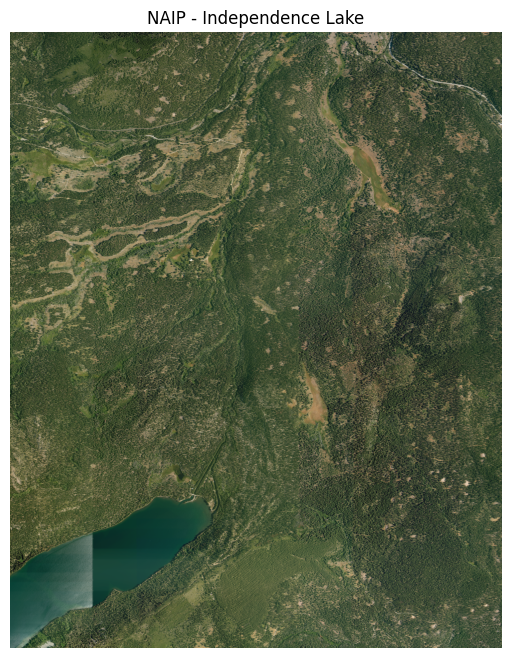

In [19]:
with rasterio.open(naip_path) as src:
    # Keeping 1/8th sample for demo purposes
    scale = 8  
    preview = src.read(
        indexes=[1,2,3], 
        out_shape=(3, src.height // scale, src.width // scale),
        resampling=rasterio.enums.Resampling.bilinear
    ).astype(np.float32)

rgb = np.transpose(preview, (1,2,0))

plt.figure(figsize=(10,8))
plt.imshow(np.clip(rgb / (np.nanmax(rgb) + 1e-12), 0, 1))
plt.title("NAIP - Independence Lake")
plt.axis("off")
plt.show()

In [20]:
with rasterio.open(naip_path) as src:
    arr_chw = src.read() 
    
arr_hwc = np.transpose(arr_chw, (1, 2, 0))
for b in range(arr_chw.shape[0]):
    band = arr_chw[b].astype(np.float32)
    nodata = src.nodata
    if nodata is not None:
        band[band == nodata] = np.nan
    print(f"Band {b+1}: min={np.nanmin(band):.3f}, max={np.nanmax(band):.3f}, mean={np.nanmean(band):.3f}")

Band 1: min=1.000, max=206.000, mean=59.655
Band 2: min=1.000, max=205.000, mean=68.386
Band 3: min=3.000, max=204.000, mean=46.562
Band 4: min=1.000, max=202.000, mean=97.874


In [21]:
# Display the array
arr_hwc

array([[[ 86,  77,  55, 110],
        [ 91,  80,  58, 114],
        [ 80,  78,  48, 129],
        ...,
        [ 31,  46,  32,  68],
        [ 55,  65,  43, 104],
        [ 57,  66,  43, 115]],

       [[ 40,  51,  31,  90],
        [ 48,  59,  34, 115],
        [ 59,  69,  38, 134],
        ...,
        [ 27,  44,  32,  57],
        [ 36,  50,  37,  53],
        [ 36,  48,  36,  49]],

       [[ 22,  41,  24,  81],
        [ 26,  46,  26,  95],
        [ 39,  57,  32, 119],
        ...,
        [ 32,  47,  36,  55],
        [ 42,  53,  38,  51],
        [ 38,  49,  37,  44]],

       ...,

       [[ 21,  62,  56,   1],
        [ 45,  74,  69,   1],
        [ 86,  98,  91,  10],
        ...,
        [ 47,  57,  44,  61],
        [ 27,  45,  33,  49],
        [ 47,  56,  41,  62]],

       [[ 36,  69,  65,   1],
        [ 86, 103,  99,   8],
        [ 94, 108, 103,  15],
        ...,
        [ 20,  36,  30,  34],
        [ 28,  43,  34,  41],
        [ 56,  60,  48,  62]],

       [[ 62

NAIP Raster Information
Path: /Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20220720.tif
CRS: EPSG:26910
Bounds: BoundingBox(left=730884.0, bottom=4368576.0, right=736872.0, top=4376076.0)
Transform:
 | 0.60, 0.00, 730884.00|
| 0.00,-0.60, 4376076.00|
| 0.00, 0.00, 1.00|
Resolution: (0.6, 0.6)
Size (width x height): 9980 x 12500
Band count: 4
Dtypes: ('uint8', 'uint8', 'uint8', 'uint8')
Nodata: None

Band names assumed: ['Red', 'Green', 'Blue', 'NIR']

Band Summary Statistics
   Band   Name  Min    Max       Mean        Std  Median    P5   P25    P75  \
0     1    Red  1.0  206.0  59.655052  37.043217    53.0  11.0  28.0   86.0   
1     2  Green  1.0  205.0  68.385788  28.414068    64.0  26.0  47.0   90.0   
2     3   Blue  3.0  204.0  46.562492  19.994602    42.0  23.0  32.0   57.0   
3     4    NIR  1.0  202.0  97.873840  48.049011   103.0  19.0  56.0  140.0   

     P95  Valid_Pixels  
0  129.0     124750000  
1  116.0     124750000  
2   85.0     124750000  
3 

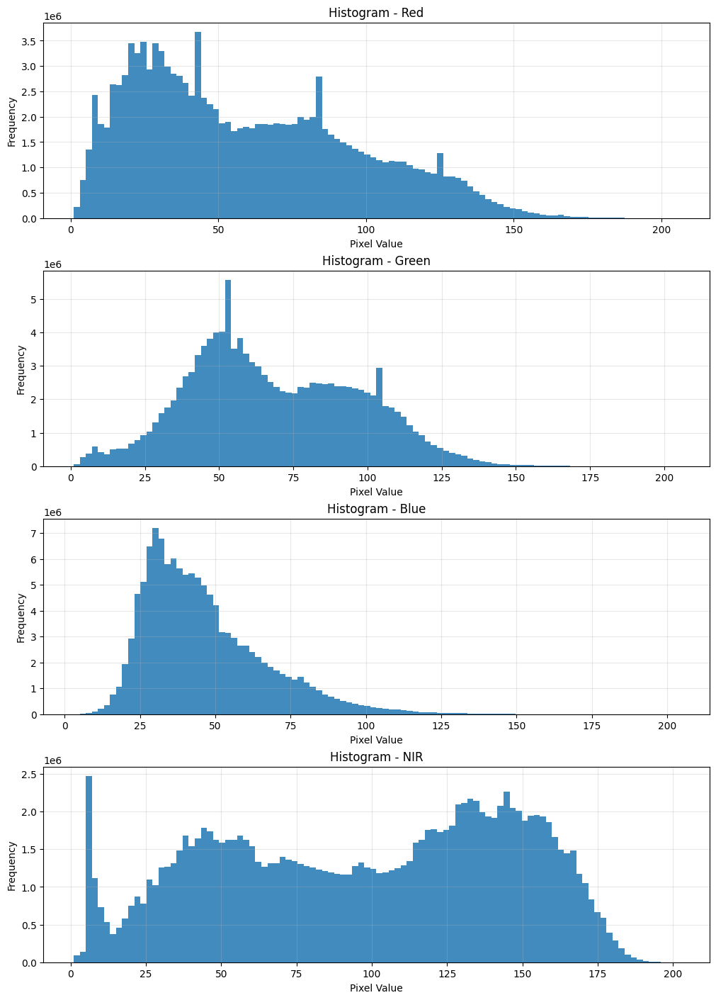

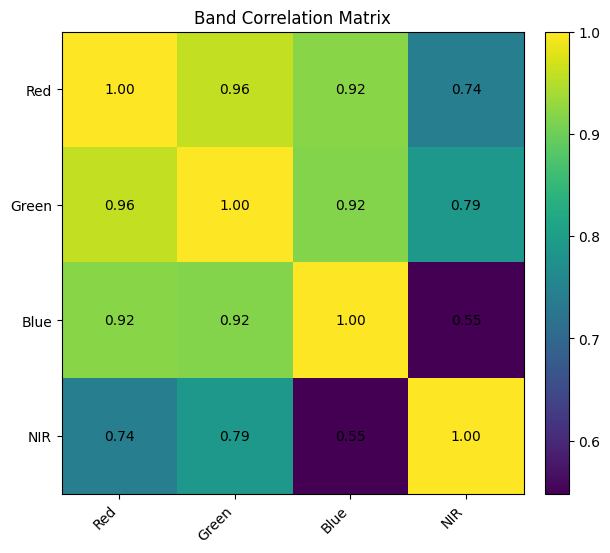

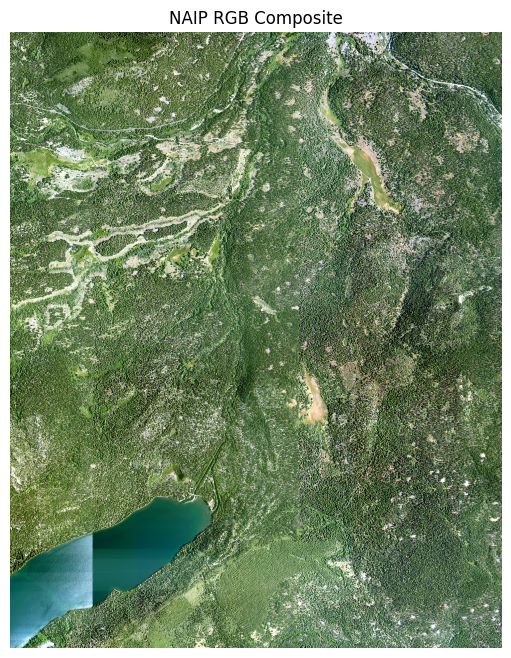

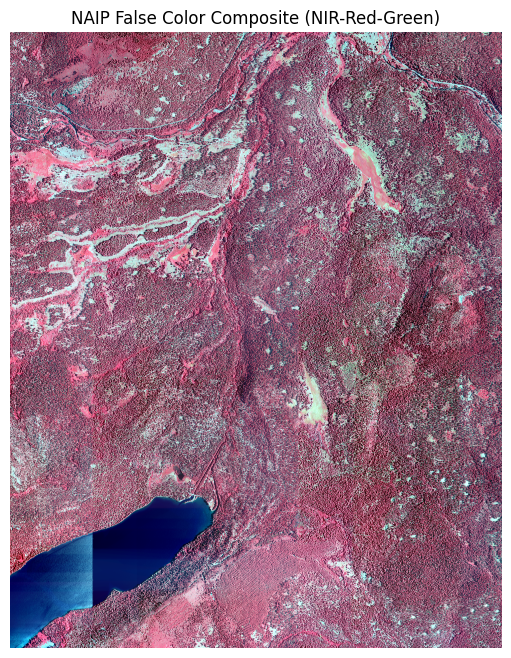


NDVI Statistics
Min   : -0.9826087
Max   : 0.9782609
Mean  : 0.2516698
Std   : 0.23288254
Median: 0.2857143


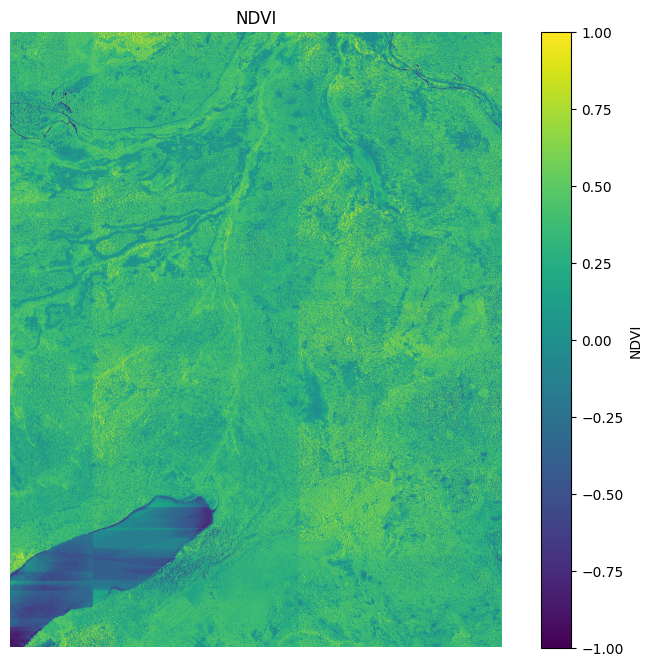

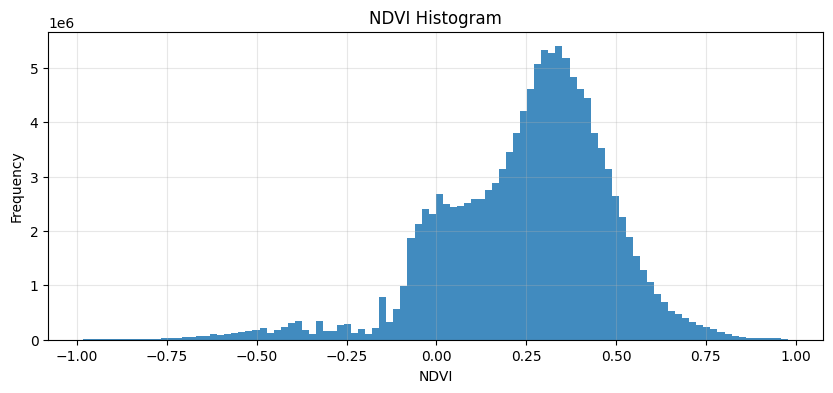

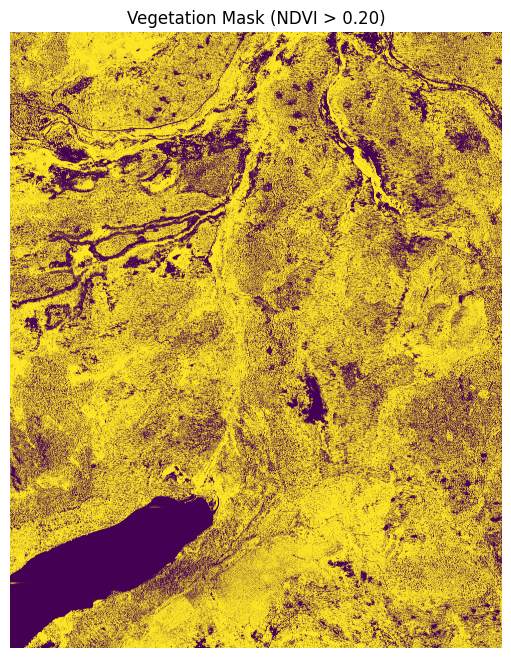

Vegetation ratio (NDVI > 0.20): 0.646


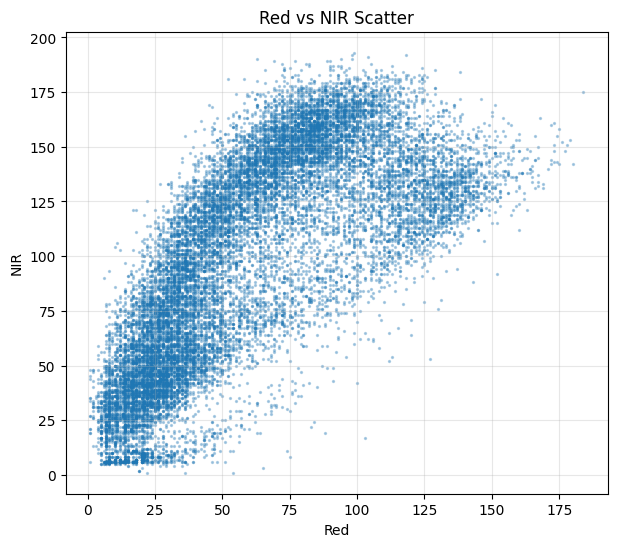


Feature Table Preview
    red  green  blue    nir      ndvi  nir_red_ratio  green_red_ratio
0  86.0   77.0  55.0  110.0  0.122449       1.279070         0.895349
1  91.0   80.0  58.0  114.0  0.112195       1.252747         0.879121
2  80.0   78.0  48.0  129.0  0.234450       1.612500         0.975000
3  82.0   82.0  48.0  142.0  0.267857       1.731707         1.000000
4  94.0   89.0  58.0  142.0  0.203390       1.510638         0.946809

Feature Table Summary
                red         green          blue           nir          ndvi  \
count  1.247500e+08  1.247500e+08  1.247500e+08  1.247500e+08  1.247500e+08   
mean   5.965505e+01  6.838579e+01  4.656249e+01  9.787384e+01  2.516698e-01   
std    3.704322e+01  2.841407e+01  1.999460e+01  4.804902e+01  2.328825e-01   
min    1.000000e+00  1.000000e+00  3.000000e+00  1.000000e+00 -9.826087e-01   
25%    2.800000e+01  4.700000e+01  3.200000e+01  5.600000e+01  1.134021e-01   
50%    5.300000e+01  6.400000e+01  4.200000e+01  1.030000e+0

In [22]:


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

# ------------------------------------------------------------
# 0) FIX PATH IF NEEDED
# ------------------------------------------------------------
naip_path = "/Users/berkayersus/Desktop/maki/NAIP/naip_data/m_3912038_ne_10_060_20220720.tif"

# ------------------------------------------------------------
# 1) READ RASTER SAFELY
# ------------------------------------------------------------
with rasterio.open(naip_path) as src:
    arr_chw = src.read().astype(np.float32)   # shape: (bands, rows, cols)
    nodata = src.nodata
    crs = src.crs
    bounds = src.bounds
    transform = src.transform
    res = src.res
    width = src.width
    height = src.height
    count = src.count
    dtypes = src.dtypes

if nodata is not None:
    arr_chw[arr_chw == nodata] = np.nan

arr_hwc = np.transpose(arr_chw, (1, 2, 0))   # shape: (rows, cols, bands)

print("=" * 60)
print("NAIP Raster Information")
print("=" * 60)
print("Path:", naip_path)
print("CRS:", crs)
print("Bounds:", bounds)
print("Transform:\n", transform)
print("Resolution:", res)
print("Size (width x height):", width, "x", height)
print("Band count:", count)
print("Dtypes:", dtypes)
print("Nodata:", nodata)

# ------------------------------------------------------------
# 2) BAND NAMES
# ------------------------------------------------------------
# Common NAIP order: Red, Green, Blue, NIR
default_band_names = ["Red", "Green", "Blue", "NIR"]
band_names = default_band_names[:count] if count <= 4 else [f"Band_{i+1}" for i in range(count)]

print("\nBand names assumed:", band_names)

# ------------------------------------------------------------
# 3) SUMMARY STATISTICS TABLE
# ------------------------------------------------------------
summary_rows = []
for i in range(arr_chw.shape[0]):
    band = arr_chw[i]
    valid = band[~np.isnan(band)]
    
    if valid.size == 0:
        summary_rows.append({
            "Band": i + 1,
            "Name": band_names[i],
            "Min": np.nan,
            "Max": np.nan,
            "Mean": np.nan,
            "Std": np.nan,
            "Median": np.nan,
            "P5": np.nan,
            "P25": np.nan,
            "P75": np.nan,
            "P95": np.nan,
            "Valid_Pixels": 0
        })
    else:
        summary_rows.append({
            "Band": i + 1,
            "Name": band_names[i],
            "Min": np.nanmin(valid),
            "Max": np.nanmax(valid),
            "Mean": np.nanmean(valid),
            "Std": np.nanstd(valid),
            "Median": np.nanmedian(valid),
            "P5": np.nanpercentile(valid, 5),
            "P25": np.nanpercentile(valid, 25),
            "P75": np.nanpercentile(valid, 75),
            "P95": np.nanpercentile(valid, 95),
            "Valid_Pixels": valid.size
        })

stats_df = pd.DataFrame(summary_rows)

print("\n" + "=" * 60)
print("Band Summary Statistics")
print("=" * 60)
print(stats_df)

# ------------------------------------------------------------
# 4) HISTOGRAMS FOR EACH BAND
# ------------------------------------------------------------
fig, axes = plt.subplots(arr_chw.shape[0], 1, figsize=(10, 3.5 * arr_chw.shape[0]), constrained_layout=True)

if arr_chw.shape[0] == 1:
    axes = [axes]

for i in range(arr_chw.shape[0]):
    band = arr_chw[i]
    valid = band[~np.isnan(band)]
    
    axes[i].hist(valid, bins=100, alpha=0.85)
    axes[i].set_title(f"Histogram - {band_names[i]}")
    axes[i].set_xlabel("Pixel Value")
    axes[i].set_ylabel("Frequency")
    axes[i].grid(alpha=0.3)

plt.show()

# ------------------------------------------------------------
# 5) PIXEL SAMPLE DATAFRAME FOR CORRELATION
# ------------------------------------------------------------
# To avoid memory issues, sample pixels if image is large
flat_df = pd.DataFrame({
    band_names[i]: arr_chw[i].ravel()
    for i in range(arr_chw.shape[0])
}).dropna()

max_sample = 200000
if len(flat_df) > max_sample:
    flat_df_sample = flat_df.sample(max_sample, random_state=42)
else:
    flat_df_sample = flat_df.copy()

corr = flat_df_sample.corr()

fig, ax = plt.subplots(figsize=(7, 6))
im = ax.imshow(corr.values)
ax.set_xticks(range(len(corr.columns)))
ax.set_yticks(range(len(corr.index)))
ax.set_xticklabels(corr.columns, rotation=45, ha="right")
ax.set_yticklabels(corr.index)
ax.set_title("Band Correlation Matrix")

for i in range(corr.shape[0]):
    for j in range(corr.shape[1]):
        ax.text(j, i, f"{corr.iloc[i, j]:.2f}", ha="center", va="center")

plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.show()

# ------------------------------------------------------------
# 6) HELPER FUNCTION FOR ROBUST VISUAL SCALING
# ------------------------------------------------------------
def robust_scale(img, lower=2, upper=98):
    """
    Stretch each channel independently using percentiles.
    Input shape should be (rows, cols, channels).
    """
    img = img.astype(np.float32)
    out = np.zeros_like(img, dtype=np.float32)

    for c in range(img.shape[2]):
        band = img[:, :, c]
        valid = band[~np.isnan(band)]
        
        if valid.size == 0:
            continue
        
        p_low, p_high = np.nanpercentile(valid, [lower, upper])
        if np.isclose(p_high, p_low):
            out[:, :, c] = 0
        else:
            out[:, :, c] = np.clip((band - p_low) / (p_high - p_low + 1e-12), 0, 1)
    
    return out

# ------------------------------------------------------------
# 7) RGB COMPOSITE
# ------------------------------------------------------------
if count >= 3:
    rgb = arr_hwc[:, :, [0, 1, 2]]
    rgb_scaled = robust_scale(rgb)

    plt.figure(figsize=(10, 8))
    plt.imshow(rgb_scaled)
    plt.title("NAIP RGB Composite")
    plt.axis("off")
    plt.show()

# ------------------------------------------------------------
# 8) FALSE COLOR COMPOSITE (NIR-RED-GREEN)
# ------------------------------------------------------------
if count >= 4:
    false_color = arr_hwc[:, :, [3, 0, 1]]
    false_scaled = robust_scale(false_color)

    plt.figure(figsize=(10, 8))
    plt.imshow(false_scaled)
    plt.title("NAIP False Color Composite (NIR-Red-Green)")
    plt.axis("off")
    plt.show()

# ------------------------------------------------------------
# 9) NDVI CALCULATION
# ------------------------------------------------------------
ndvi = None

if count >= 4:
    red = arr_chw[0]
    nir = arr_chw[3]

    ndvi = (nir - red) / (nir + red + 1e-12)

    print("\n" + "=" * 60)
    print("NDVI Statistics")
    print("=" * 60)
    print("Min   :", np.nanmin(ndvi))
    print("Max   :", np.nanmax(ndvi))
    print("Mean  :", np.nanmean(ndvi))
    print("Std   :", np.nanstd(ndvi))
    print("Median:", np.nanmedian(ndvi))

    plt.figure(figsize=(10, 8))
    plt.imshow(ndvi, vmin=-1, vmax=1)
    plt.title("NDVI")
    plt.colorbar(label="NDVI")
    plt.axis("off")
    plt.show()

# ------------------------------------------------------------
# 10) NDVI HISTOGRAM + VEGETATION MASK
# ------------------------------------------------------------
if ndvi is not None:
    valid_ndvi = ndvi[~np.isnan(ndvi)]

    plt.figure(figsize=(10, 4))
    plt.hist(valid_ndvi, bins=100, alpha=0.85)
    plt.title("NDVI Histogram")
    plt.xlabel("NDVI")
    plt.ylabel("Frequency")
    plt.grid(alpha=0.3)
    plt.show()

    # Simple vegetation threshold
    vegetation_mask = ndvi > 0.20

    plt.figure(figsize=(10, 8))
    plt.imshow(vegetation_mask)
    plt.title("Vegetation Mask (NDVI > 0.20)")
    plt.axis("off")
    plt.show()

    veg_ratio = np.mean(vegetation_mask[~np.isnan(ndvi)])
    print(f"Vegetation ratio (NDVI > 0.20): {veg_ratio:.3f}")


# 11)SIMPLE NIR/RED SCATTER SAMPLE

if count >= 4:
    scatter_df = pd.DataFrame({
        "Red": arr_chw[0].ravel(),
        "NIR": arr_chw[3].ravel()
    }).dropna()

    scatter_sample = scatter_df.sample(min(20000, len(scatter_df)), random_state=42)

    plt.figure(figsize=(7, 6))
    plt.scatter(scatter_sample["Red"], scatter_sample["NIR"], s=2, alpha=0.3)
    plt.xlabel("Red")
    plt.ylabel("NIR")
    plt.title("Red vs NIR Scatter")
    plt.grid(alpha=0.3)
    plt.show()


# 12) FEATURE TABLE FOR SHRUB / VEGETATION MODELING

feature_df = pd.DataFrame()

for i in range(count):
    feature_df[band_names[i].lower()] = arr_chw[i].ravel()

if ndvi is not None:
    feature_df["ndvi"] = ndvi.ravel()

if count >= 4:
    feature_df["nir_red_ratio"] = arr_chw[3].ravel() / (arr_chw[0].ravel() + 1e-12)
    feature_df["green_red_ratio"] = arr_chw[1].ravel() / (arr_chw[0].ravel() + 1e-12)

feature_df = feature_df.replace([np.inf, -np.inf], np.nan).dropna()

print("\n" + "=" * 60)
print("Feature Table Preview")
print("=" * 60)
print(feature_df.head())

print("\n" + "=" * 60)
print("Feature Table Summary")
print("=" * 60)
print(feature_df.describe())



print("\nAnalysis completed successfully.")